In [1]:
from osgeo import gdal
import rioxarray
import rasterio
import matplotlib.pyplot as plt
from rasterio.plot import show
from shapely.geometry import box
import numpy as np

In [2]:
input_path = "/pfs/work7/workspace/scratch/tu_zxmav84-ds_project/data/orthophotos/raw_tiles/32671_5331.tif"


In [3]:
num_subtiles = 2

In [4]:
# Read in  tif as GDAL dataset
dataset = gdal.Open(input_path)

# Get geotransform
gt = dataset.GetGeoTransform()
# Get upper left coordinate of whole image and resolution
xmin = gt[0]
ymax = gt[3]
res = gt[1]

# Calculate length of axes
xlen = res * dataset.RasterXSize
ylen = res * dataset.RasterYSize

# calculate size of one subset
xsize = xlen/num_subtiles
ysize = ylen/num_subtiles

# Calculate x-coordinates where a split takes place
xsteps = [xmin + xsize * i for i in range(num_subtiles+1)]
ysteps = [ymax - ysize * i for i in range(num_subtiles+1)]

for i in range(num_subtiles):
    for j in range(num_subtiles):
        xmin = xsteps[i]
        xmax = xsteps[i+1]
        ymax = ysteps[j]
        ymin = ysteps[j+1]

        print(xmin, xmax, ymin, ymax)
    

        gdal.Warp("split_test"+str(i)+str(j)+".tif", 
                    dataset, 
                    outputBounds = (xmin, ymin, xmax, ymax), dstNodata = None)


671000.0 671500.0 5331500.0 5332000.0
671000.0 671500.0 5331000.0 5331500.0
671500.0 672000.0 5331500.0 5332000.0
671500.0 672000.0 5331000.0 5331500.0


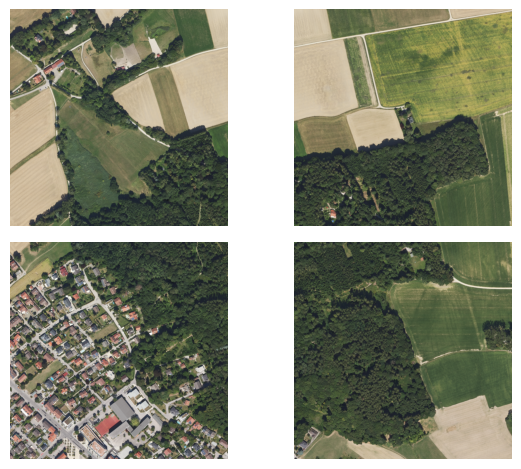

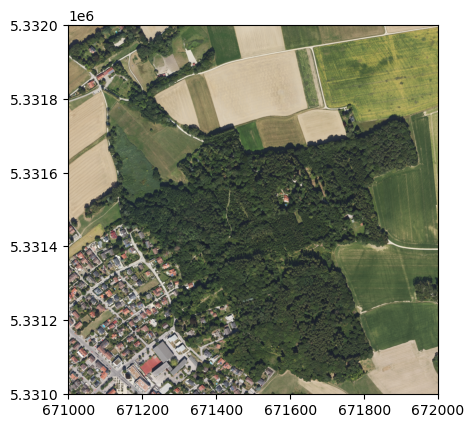

In [5]:
fig, ax = plt.subplots(2,2)
show(rasterio.open("split_test00.tif"), ax = ax[0,0])
show(rasterio.open("split_test01.tif"), ax = ax[1,0])
show(rasterio.open("split_test10.tif"), ax = ax[0,1])
show(rasterio.open("split_test11.tif"), ax = ax[1,1])
[axs.axis('off') for axs in fig.get_axes()]
fig.tight_layout()
plt.show()

show(rasterio.open(input_path))
plt.show()

In [6]:
t = rioxarray.open_rasterio('split_test00.tif')
print(t.rio.bounds())
t_repr = t.rio.reproject('EPSG:4326')
print(t_repr.rio.bounds())

(671000.0, 5331500.0, 671499.9999999999, 5332000.0)
(11.297485941352711, 48.11365088728101, 11.304400862612912, 48.118278913013334)


In [7]:
t = rioxarray.open_rasterio('split_test01.tif')
print(t.rio.bounds())
t_repr = t.rio.reproject('EPSG:4326')
print(t_repr.rio.bounds())

(671000.0, 5331000.0, 671499.9999999999, 5331500.0)
(11.297285483121701, 48.10915626457422, 11.304200018296234, 48.11378403190672)



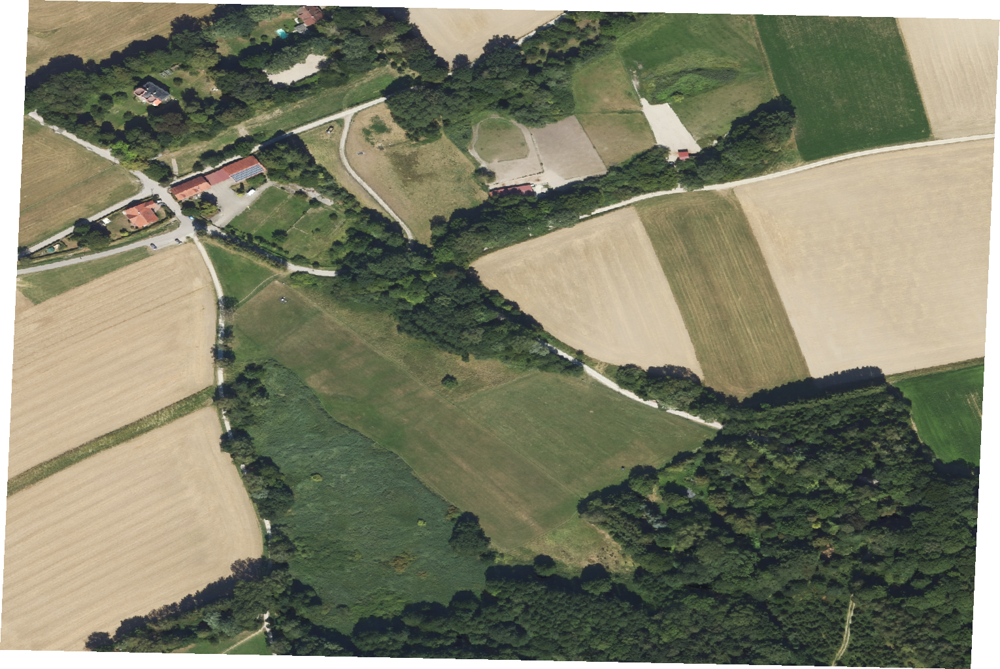
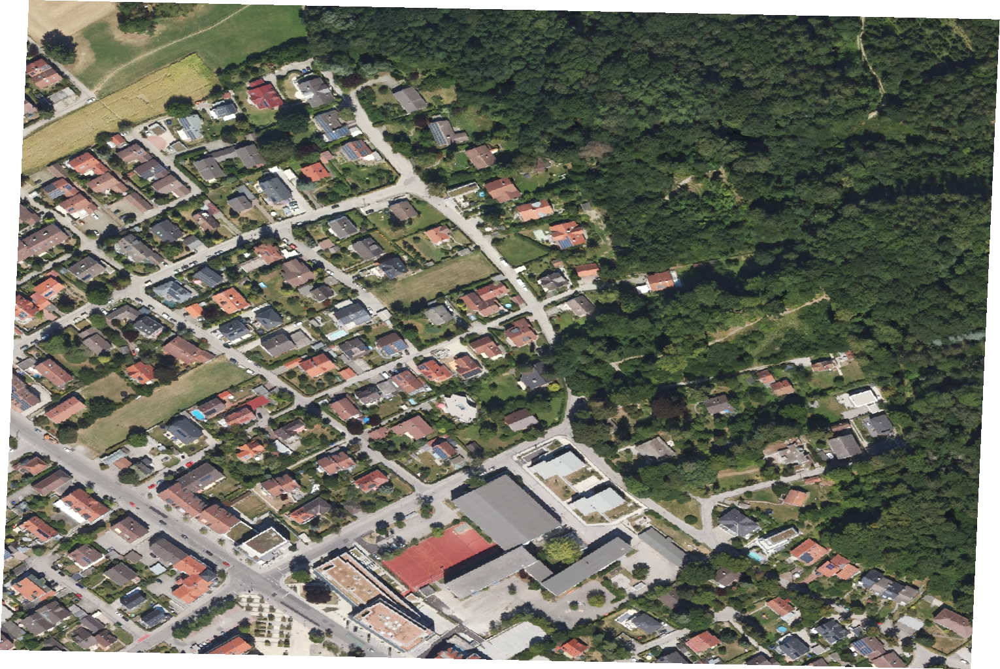

In [8]:
dst = rioxarray.open_rasterio('split_test00.tif')
dst = dst.rio.reproject('EPSG:4326')
image_bounds = box(*dst.rio.bounds())

# %%
img = np.dstack((dst.values[0], dst.values[1], dst.values[2]))
# %%
import folium
m = folium.Map(location=[image_bounds.centroid.y, image_bounds.centroid.x], zoom_start=14)
folium.GeoJson(image_bounds.__geo_interface__).add_to(m)
min_x, min_y, max_x, max_y = dst.rio.bounds()

corner_coordinates = [[min_y, min_x], [max_y, max_x]]
folium.raster_layers.ImageOverlay(
        img,
        bounds=corner_coordinates,
        opacity=0.8,
        interactive=True,
        cross_origin=False,
        zindex=1,
    ).add_to(m)

dst = rioxarray.open_rasterio('split_test01.tif')
dst = dst.rio.reproject('EPSG:4326')
image_bounds = box(*dst.rio.bounds())

# %%
img = np.dstack((dst.values[0], dst.values[1], dst.values[2]))
folium.GeoJson(image_bounds.__geo_interface__).add_to(m)
min_x, min_y, max_x, max_y = dst.rio.bounds()

corner_coordinates = [[min_y, min_x], [max_y, max_x]]
folium.raster_layers.ImageOverlay(
        img,
        bounds=corner_coordinates,
        opacity=0.8,
        interactive=True,
        cross_origin=False,
        zindex=1,
    ).add_to(m)

m